In [1]:
using DifferentialEquations
using Plots
gr(fmt = :png)

Plots.GRBackend()

In [2]:
const c = 3.0*10.0^10
const G = 6.67*10.0^-8
const K = 1.98*10.0^-6
const gamma = 11/4

2.75

In [3]:
function diff_eq(du, u, p, r)
    if u[2] >= 0.0
        du[1] = 4*pi*r^2*((u[2]/K)^(1/gamma)+u[2]/c^2)
        du[2] = -G*((u[2]/K).^(1/gamma) + u[2]/c^2)*(u[1] + 4*pi*r^3*u[2]/c^2)/(r*(r-2*u[1]*G/c^2))
    else
        du[1] = 0
        du[2] = 0
    end
    return du
end

diff_eq (generic function with 1 method)

In [4]:
N = 5000
sol_fin = Array{Any,1}(undef,0)
rho = zeros(N)
P = zeros(N)
for j = 1:N
    rho_c = (j/100)*10.0^14
    rho[j] = rho_c
    P_c = K*rho_c^gamma
    P[j] = P_c
    u0 = [0.0, P_c]
    p = 0.0
    rspan = (1.0,1500000.0)
    prob = ODEProblem(diff_eq,u0,rspan, p)
    sol = solve(prob, force_dtmin=true)
    push!(sol_fin, sol)
end

┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = tstop_saveat_disc_handling at solve.jl:371 [inlined]
└ @ Core C:\Users\Vojta\.julia\packages\OrdinaryDiffEq\NS3ps\src\solve.jl:371
┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = #__init#203(::Int64, ::Array{Float64,1}, ::Array{Float64,1}, ::Array{Float64,1}, ::Nothing, ::Bool, ::Nothing, ::Bool, ::Bool, ::Nothing, ::Bool, ::Bool, ::Float64, ::Bool, ::Rational{Int64}, ::Nothing, ::Nothing, ::Int64, ::Rational{Int64}, ::Int64, ::Int64, ::Rational{Int64}, ::Bool, ::Int64, ::Nothing, ::Nothing, ::Int64, ::Float64, ::Float64, ::typeof(DiffEqBase.ODE_DEFAULT_NORM), ::typeof(LinearAlgebra.opnorm), ::typeof(DiffEqBase.ODE_DEFAULT_ISOUTOFDOMAIN), ::typeof(DiffEqBase.ODE_DEFAULT_UNSTABLE_CHECK), ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Int64, ::String, ::typeof(DiffEqBase.ODE_DEFAU

In [5]:
mass_r = Array{Any,1}(undef,0)
for j = 1:N
    for k = 1:size(sol_fin[j], 2)
        if sol_fin[j][k+1][2] <= 0.0
            push!(mass_r, [sol_fin[j].t[k], sol_fin[j][k][1]])
            break
        end
    end
end

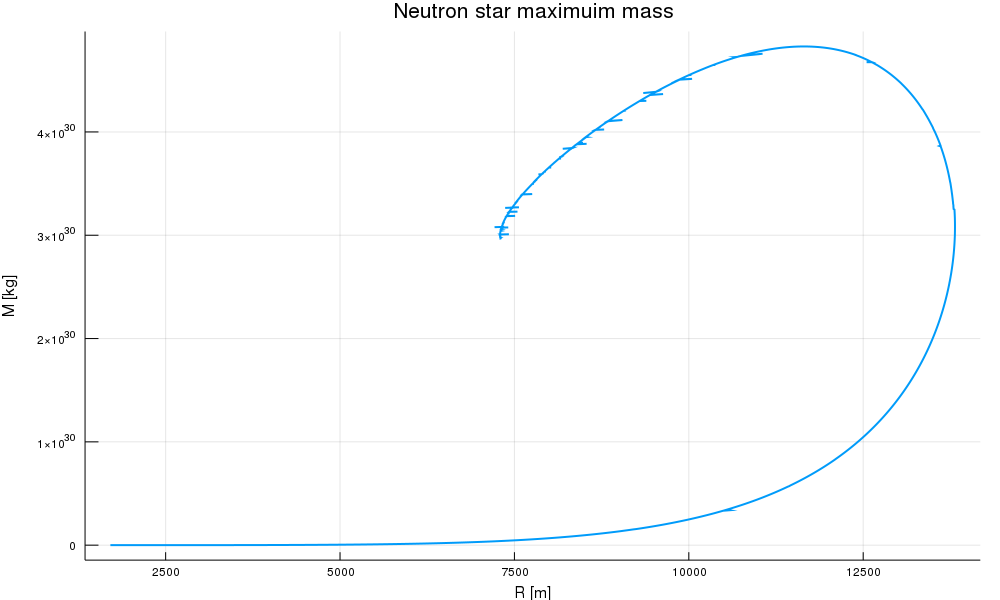

In [6]:
Plots.plot([mass_r[i][1]/100 for i = 1:size(mass_r,1)], [mass_r[i][2]/1000 for i = 1:size(mass_r,1)], legend = :none, linewidth = 2, xlabel = "R [m]", ylabel = "M [kg]", size = (1000, 600), title = "Neutron star maximuim mass")

In [15]:
println.(sol_fin[1000][:])

[0.0, 3.52099e35]
[1.74826e10, 3.52099e35]
[1.92311e11, 3.52099e35]
[1.94078e12, 3.52099e35]
[1.94448e13, 3.52099e35]
[1.96416e14, 3.52099e35]
[2.16634e15, 3.52099e35]
[4.90024e16, 3.52099e35]
[1.03465e19, 3.52099e35]
[3.79347e21, 3.52099e35]
[3.59874e23, 3.52099e35]
[1.27149e25, 3.52098e35]
[2.23395e26, 3.52094e35]
[2.36116e27, 3.52072e35]
[1.70725e28, 3.51997e35]
[9.23409e28, 3.51785e35]
[3.98153e29, 3.51266e35]
[1.4946e30, 3.50088e35]
[4.9876e30, 3.4761e35]
[1.51514e31, 3.42691e35]
[4.22723e31, 3.33487e35]
[1.0905e32, 3.17208e35]
[2.60294e32, 2.90156e35]
[5.72862e32, 2.48396e35]
[1.1517e33, 1.89906e35]
[2.08313e33, 1.18674e35]
[3.31572e33, 4.92714e34]
[4.23399e33, 1.24527e34]
[4.55381e33, 2.92653e33]
[4.64109e33, 7.36076e32]
[4.66143e33, 2.64166e32]
[4.6704e33, 6.32502e31]
[4.67231e33, 2.13316e31]
[4.67299e33, 6.57599e30]
[4.67322e33, 1.4936e30]
[4.67327e33, 5.25762e29]
[4.67328e33, 1.57487e29]
[4.67329e33, 3.56404e28]
[4.67329e33, 1.13791e28]
[4.67329e33, 4.76026e27]
[4.67329e33, 1

106-element Array{Nothing,1}:
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 ⋮      
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing

In [14]:
k = 1000
R = mass_r[k][1]
M = mass_r[k][2]
S = 0.0


for i = 1:size(sol_fin,1)
    if sol_fin[k][i][2] >= 0.0
        rp1 = r = sol_fin[k][i+1][1]
        r = sol_fin[k][i][1]
        S += (rp1 - r)/sqrt(1 - 2*M*r^2/R^3*)
    end
end

DomainError: DomainError with -1.418318887482586e36:
sqrt will only return a complex result if called with a complex argument. Try sqrt(Complex(x)).

In [39]:
r = sol_fin[k][106-22-60][1]

84910.81620561708

In [37]:
r^2/R^3 * 2*M *G*2/c^2

2.2572177563948968e53